In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torchvision

## Full Label Crop

In [2]:
data_dir = "dataset/raw_dataset/full_label"
img_pth_list = []
for root, dirs, files in os.walk(data_dir):
    for file in files:
        if file[-3:] == "jpg":
            img_pth = os.path.join(root, file)
            img_pth_list.append(img_pth)
print(len(img_pth_list))
print(img_pth_list[0])

181
dataset/raw_dataset/full_label/1_230518_123516/1_059_G001_C.jpg


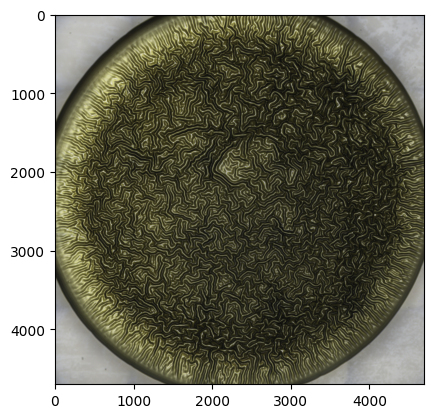

In [4]:
for i, img_pth in enumerate(img_pth_list):
    img = Image.open(img_pth)
    img = np.array(img)
    plt.imshow(img)
    break

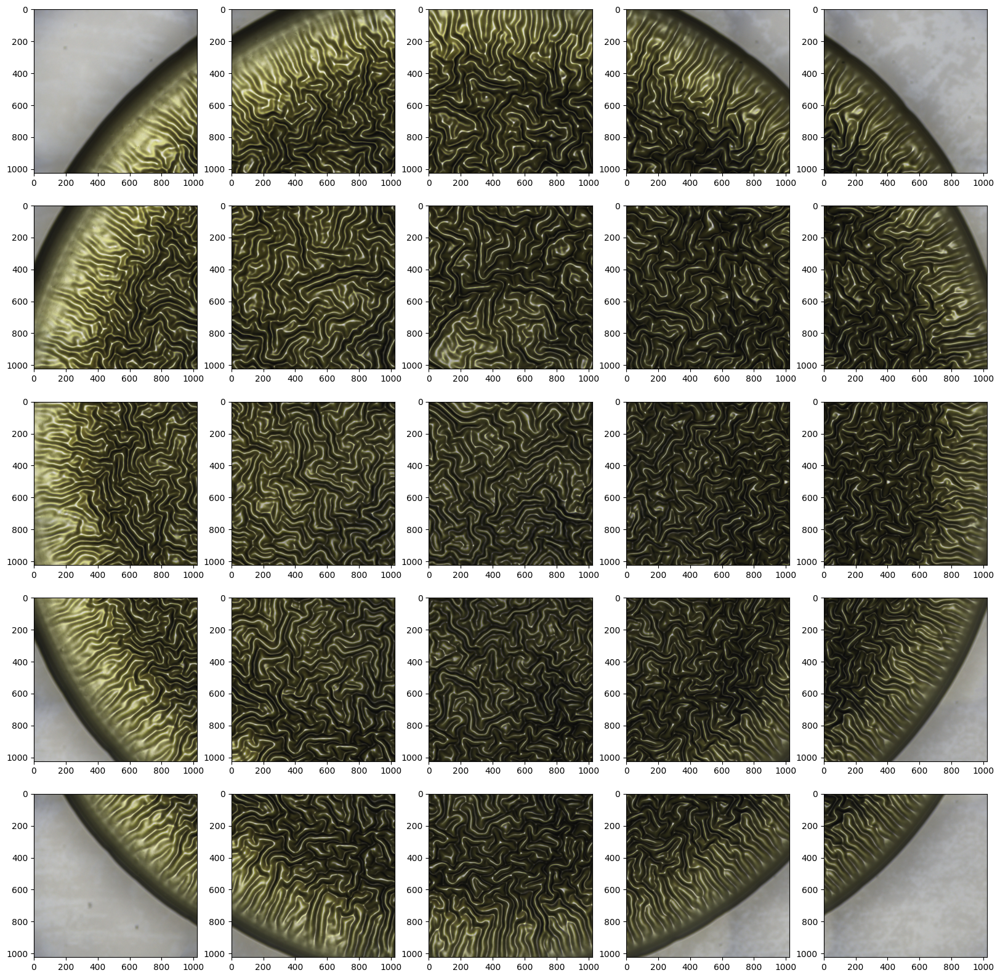

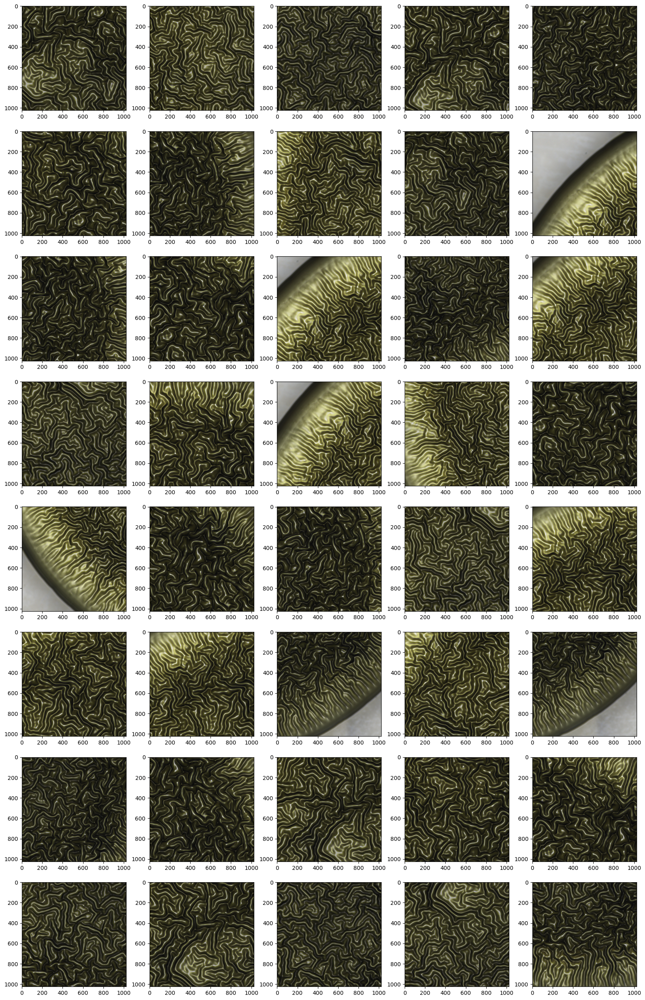

11190 11190 11190


In [3]:
import random

def get_image_grid(img, label, size=1024):
    w, h, _ = img.shape
    n1 = w // size + 1
    n2 = h // size + 1
    img_list = []
    label_list = []
    sample_list = []
    coord_list = []
    for i in range(n1):
        x = i * size if i != n1 - 1 else w - size
        for j in range(n2):
            y = j * size if j != n2 - 1 else h - size
            img_list.append(img[x:x+size, y:y+size])
            label_list.append(label)
            sample_list.append(0)
            coord_list.append((x, y, x+size, y+size))
    return img_list, label_list, sample_list, n1, n2, coord_list

def get_random_crop(img, label, n=20, size=1024):
    w, h, _ = img.shape
    img_list = []
    label_list = []
    sample_list = []
    coord_list = []
    for i in range(n):
        x = random.randint(0, w - size)
        y = random.randint(0, h - size)
        img_list.append(img[x:x+size, y:y+size])
        label_list.append(label)
        sample_list.append(1)
        coord_list.append((x, y, x+size, y+size))
    return img_list, label_list, sample_list, coord_list
    

img_list = []
label_list = []
sample_list = []
coord_list = []
for i, img_pth in enumerate(img_pth_list):
    img = Image.open(img_pth)
    img = np.array(img)
    _img_list, _label_list, _sample_list, n1, n2, _coord_list = get_image_grid(img, label=i)
    img_list += _img_list
    label_list += _label_list
    sample_list += _sample_list
    coord_list += _coord_list
    if i == 0:
        plt.figure(figsize=(4*n1, 4*n2))
        for j, im in enumerate(_img_list):
            plt.subplot(n1, n2, j+1)
            plt.imshow(im)
        plt.show()
        plt.close()
    _img_list, _label_list, _sample_list, _coord_list = get_random_crop(img, label=i, n=40)
    img_list += _img_list
    label_list += _label_list
    sample_list += _sample_list
    coord_list += _coord_list
    if i == 0:
        plt.figure(figsize=(4*5, 8*4))
        for j, im in enumerate(_img_list):
            plt.subplot(8, 5, j+1)
            plt.imshow(im)
        plt.show()
        plt.close()
        
# data_dir = "dataset/raw_dataset/uniquness"
# img_pth_list = []
# for root, dirs, files in os.walk(data_dir):
#     for file in files:
#         if file[-3:] == "jpg":
#             img_pth = os.path.join(root, file)
#             img = Image.open(img_pth)
#             img = np.array(img)
#             img_list.append(img)
#             label_list.append(-1)
#             coord_list.append((0, 0, 1024, 1024))
            
print(len(img_list), len(label_list), len(sample_list))

In [4]:
save_dir = "dataset/dataset_v2/train"
save_train_list = "dataset/dataset_v2/train.txt"
save_sample_list = "dataset/dataset_v2/sample.txt"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
with open(save_train_list, "w") as f1:
    with open(save_sample_list, "w") as f2:
        for i, (img, label, sample, coord) in enumerate(zip(img_list, label_list, sample_list, coord_list)):
            img_save_pth = os.path.join(save_dir, "{:0>5d}.jpg".format(i))
            img = Image.fromarray(img)
            img.save(img_save_pth)
            f1.writelines("{} {} {} {} {} {}\n".format(img_save_pth, label, coord[0], coord[1], coord[2], coord[3]))
            if sample == 0:
                f2.writelines("{} {} {} {} {} {}\n".format(img_save_pth, label, coord[0], coord[1], coord[2], coord[3]))

In [8]:
save_dir = "dataset/dataset_v2/test"
save_train_list = "dataset/dataset_v2/query.txt"
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
with open(save_train_list, "w") as f1:
    for i, (img, label, coord) in enumerate(zip(img_list, label_list, coord_list)):
        img_save_pth = os.path.join(save_dir, "{:0>5d}.jpg".format(i))
        img = Image.fromarray(img)
        img.save(img_save_pth)
#         print("{} {} {} {} {} {}".format(img_save_pth, label, coord[0], coord[1], coord[2], coord[3]))
        f1.writelines("{} {} {} {} {} {}\n".format(img_save_pth, label, coord[0], coord[1], coord[2], coord[3]))